## Load Packages

In [1]:
import os, sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import torch
# sys.path.append('./')  # uncomment for local import
import tangram as tg

%load_ext autoreload
%autoreload 2
%matplotlib inline

tg.__version__

import squidpy as sq

/Users/ruiqil/miniconda3/envs/tangram-env/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


#### Load spatial ATAC data

In [2]:
ad_sp = sc.read_h5ad("/Users/ruiqil/Documents/Spatial_ATAC-seq/data.h5ad")
ad_sp

AnnData object with n_obs × n_vars = 2275 × 4109
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'Sample', 'TSSEnrichment', 'ReadsInTSS', 'ReadsInPromoter', 'ReadsInBlacklist', 'PromoterRatio', 'PassQC', 'NucleosomeRatio', 'nMultiFrags', 'nMonoFrags', 'nFrags', 'nDiFrags', 'BlacklistRatio', 'cellID_archr', 'in_tissue', 'array_row', 'array_col'
    var: 'features'

In [3]:
ad_sp.obs

,orig.ident,nCount_Spatial,nFeature_Spatial,Sample,TSSEnrichment,ReadsInTSS,ReadsInPromoter,ReadsInBlacklist,PromoterRatio,PassQC,NucleosomeRatio,nMultiFrags,nMonoFrags,nFrags,nDiFrags,BlacklistRatio,cellID_archr,in_tissue,array_row,array_col
AACGTGATAACGTGAT,0,1779.408752,4052,ME13,4.308,161.0,856.0,312.0,0.053413,1.0,0.985382,1624.0,4036.0,8013.0,2353.0,0.019468,ME13#AACGTGATAACGTGAT-1,1,0,0
AACGTGATAAACATCG,0,1823.665303,4052,ME13,2.635,499.0,3087.0,1663.0,0.035763,1.0,1.070175,9691.0,20848.0,43159.0,12620.0,0.019266,ME13#AACGTGATAAACATCG-1,1,1,0
AACGTGATATGCCTAA,0,1819.093055,4052,ME13,2.891,641.0,4369.0,2058.0,0.041322,1.0,1.011529,11586.0,26281.0,52865.0,14998.0,0.019465,ME13#AACGTGATATGCCTAA-1,1,2,0
AACGTGATAGTGGTCA,0,1825.933048,4052,ME13,2.142,251.0,1696.0,983.0,0.033378,1.0,0.999843,5658.0,12704.0,25406.0,7044.0,0.019346,ME13#AACGTGATAGTGGTCA-1,1,3,0
AACGTGATACCACTGT,0,1872.598448,4052,ME13,2.480,362.0,2340.0,1784.0,0.029964,1.0,0.908082,7641.0,20464.0,39047.0,10942.0,0.022844,ME13#AACGTGATACCACTGT-1,1,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GCCACATAGAATCTGA,0,1806.907790,4052,ME13,6.205,4653.0,21576.0,5136.0,0.076733,1.0,0.873448,25642.0,75044.0,140591.0,39905.0,0.018266,ME13#GCCACATAGAATCTGA-1,1,45,49
GCCACATACAAGACTA,0,1786.205441,4052,ME13,5.678,3808.0,17903.0,4113.0,0.074843,1.0,0.854153,21281.0,64506.0,119604.0,33817.0,0.017194,ME13#GCCACATACAAGACTA-1,1,46,49
GCCACATAGAGCTGAA,0,1801.536230,4052,ME13,5.522,3804.0,18100.0,4215.0,0.070612,1.0,0.858487,22390.0,68962.0,128165.0,36813.0,0.016444,ME13#GCCACATAGAGCTGAA-1,1,47,49
GCCACATAGATAGACA,0,1921.704220,4052,ME13,5.576,14529.0,70354.0,18781.0,0.071745,1.0,0.967563,92810.0,249193.0,490303.0,148300.0,0.019152,ME13#GCCACATAGATAGACA-1,1,48,49


- The voxel coordinates are saved in the fields `array_col` and `array_row` which we can use to visualize the spatial ROI. Each "dot" is the center of a 10um voxel.

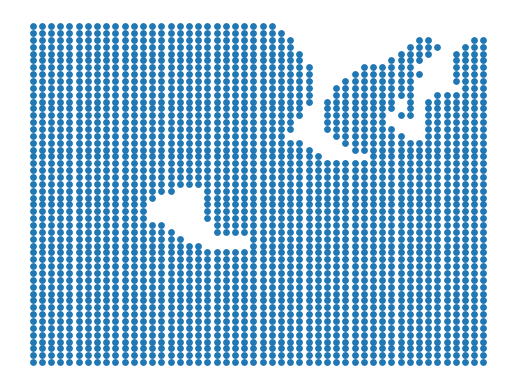

In [4]:
xs = ad_sp.obs.array_col
ys = ad_sp.obs.array_row
plt.axis('off')
plt.scatter(xs, ys, s=15);
plt.gca().invert_yaxis()

### Load Single cell data
Load public data available in Squidpy, from mouse brain cortex. Single cell data are stored in `adata_sc`.

Pre-processed scRNA-seq mouse cortex [https://doi.org/10.1038/s41586-018-0654-5].

In [5]:
ad_sc = sq.datasets.sc_mouse_cortex()

<AxesSubplot: title={'center': 'cell_subclass'}, xlabel='UMAP1', ylabel='UMAP2'>

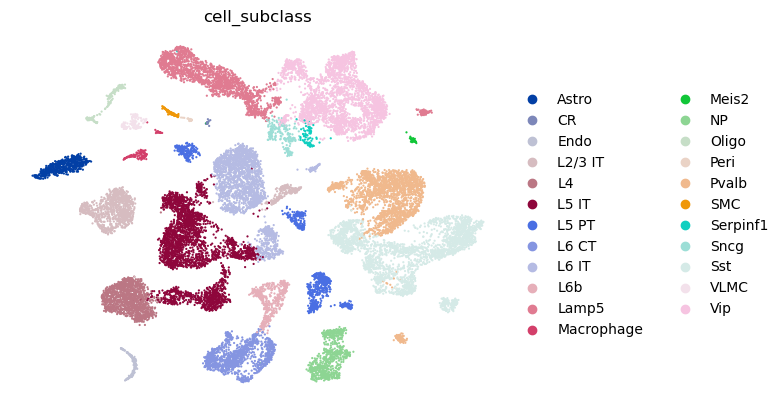

In [6]:
sc.pl.umap(
    ad_sc, color="cell_subclass", size=10, frameon=False, show=False
)

****

### The Tangram trick: scRNA-seq are the new spatial data

Tangram learns a spatial alignment of the single cell data so that the gene expression of the aligned single cell data is as similar as possible to that of the spatial data, by looking at a subset of genes called the training genes. Training genes need to bear interesting signal and to be measured with high quality. Typically, we choose the training genes are 100-1000 differentially expressedx genes, stratified across cell types. Sometimes, we also use the entire transcriptome, or perform different mappings using different set of training genes to see how much the result change.

Tangram fits the scRNA-seq profiles on space using a custom loss function based on cosine similarity. The method is summarized in the sketch below:

![title](figures/how_tangram_works.png)

### Pre-processing

In [7]:
# sc.tl.rank_genes_groups(ad_sc, groupby="cell_subclass", use_raw=False)
# markers_df = pd.DataFrame(ad_sc.uns["rank_genes_groups"]["names"]).iloc[0:100, :]
# markers = list(np.unique(markers_df.melt().value.values))
# len(markers)

In [8]:
np.unique(ad_sc.X.toarray()[0, :])

array([ 0.       ,  0.8550011,  1.3090769,  1.6202059,  1.8571583,
        2.048581 ,  2.209182 ,  2.347524 ,  2.4690328,  2.5773637,
        2.675098 ,  2.7641246,  2.8458695,  2.9214344,  2.991688 ,
        3.0573285,  3.1189244,  3.1769452,  3.2317836,  3.2837703,
        3.3331876,  3.3802774,  3.4252489,  3.4682848,  3.5095448,
        3.5491698,  3.587284 ,  3.6239989,  3.6594133,  3.6936166,
        3.7266884,  3.7587013,  3.7897213,  3.8198078,  3.8490155,
        3.8773942,  3.9049897,  3.9318442,  3.9579964,  3.983482 ,
        4.008334 ,  4.0325837,  4.056259 ,  4.0793867,  4.1019917,
        4.124097 ,  4.1457243,  4.1668935,  4.187624 ,  4.2079334,
        4.2278385,  4.247355 ,  4.266498 ,  4.285281 ,  4.3037186,
        4.3218217,  4.3396034,  4.357074 ,  4.3742447,  4.3911257,
        4.4077263,  4.424056 ,  4.440123 ,  4.455936 ,  4.4715033,
        4.4868317,  4.5019283,  4.516801 ,  4.531455 ,  4.545898 ,
        4.560135 ,  4.5741725,  4.5880156,  4.6016693,  4.6151

- Here, we only do some light pre-processing as library size correction (in scanpy, via `sc.pp.normalize`) to normalize the number of count within each cell to a fixed number. Ideally, the single cell and spatial datasets, should exhibit signals as similar as possible and the pre-processing pipeline should be finalized to harmonize the signals.

In [9]:
sc.pp.normalize_total(ad_sc)
ad_sc.obs.cell_subclass

F2S4_151217_005_B01    Pvalb
F2S4_151217_005_C01       L4
F2S4_151217_005_E01       L4
F2S4_151217_005_F01       L4
F2S4_151217_005_G01       L4
                       ...  
F1S4_180124_317_D01    Lamp5
F1S4_180124_317_E01     Sncg
F1S4_180124_317_F01      Sst
F1S4_180124_317_G01     Sncg
F1S4_180124_317_H01     Sncg
Name: cell_subclass, Length: 21697, dtype: category
Categories (23, object): ['Astro', 'CR', 'Endo', 'L2/3 IT', ..., 'Sncg', 'Sst', 'VLMC', 'Vip']

- It is a good idea to have annotations in the single cell data, as they will be projected on space after we map.
- In this case, cell types are annotated in the `subclass_label` field, for which we plot cell counts.

In [10]:
ad_sc.obs.cell_subclass.value_counts()

L5 IT         2952
Vip           2645
Sst           2534
L6 IT         2166
Pvalb         2065
Lamp5         1837
L4            1340
L6 CT         1220
L2/3 IT       1172
L5 PT          895
NP             733
Astro          545
L6b            457
Sncg           244
Oligo          185
Endo           155
VLMC           131
Macrophage     131
SMC            106
Serpinf1        84
Meis2           55
Peri            28
CR              17
Name: cell_subclass, dtype: int64

***
#### Prepare to map

- In doing this, Tangram only looks at a subset genes, specified by the user, called the training genes.
- The choice of the training genes is a delicate step for mapping: they need to bear interesting signals and to be measured with high quality.
- Typically, a good start is to choose 100-1000 top marker genes, evenly stratified across cell types. Sometimes, we also use the entire transcriptome, or perform different mappings using different set of training genes to see how much the result change.

For this case, we use 1335 marker genes as training genes.

In [11]:
sc.tl.rank_genes_groups(ad_sc, groupby="cell_subclass", use_raw=False)
markers_df = pd.DataFrame(ad_sc.uns["rank_genes_groups"]["names"]).iloc[0:100, :]
markers = list(np.unique(markers_df.melt().value.values))
len(markers)

1335

In [12]:
markers_df

,Astro,CR,Endo,L2/3 IT,L4,L5 IT,L5 PT,L6 CT,L6 IT,L6b,...,NP,Oligo,Peri,Pvalb,SMC,Serpinf1,Sncg,Sst,VLMC,Vip
0,Gpr37l1,Ramp1,Sparc,Calb1,Rorb,Neurod6,Fam19a1,Crym,Tesc,Nxph3,...,Tshz2,Olig1,Myl9,Cox6a2,Mfge8,Nov,Npas1,Sst,Apod,Adarb2
1,Ppap2b,Stmn1-rs2,Pltp,Lamp5,Nrn1,Nrn1,Fezf2,Rprm,Rasl10a,Slc17a7,...,Fezf2,Pllp,Vtn,Pvalb,Acta2,Kcnip1,Adarb2,Lhx6,Sparc,Synpr
2,Slc1a3,Rnpc3,Ly6c1,Itpka,Fmnl1,Itpka,Lamp5,Hs3st4,Slc17a7,Hs3st4,...,Etv1,Cd9,Higd1b,Nxph1,Myl9,Adarb2,Kcnip1,Nxph1,Ifitm2,Vip
3,Aldoc,Map1b,Cldn5,Ptk2b,Lingo1,Krt12,Pou3f1,3110035E14Rik,Neurod6,Tle4,...,Nxph3,Sox10,Igfbp7,Erbb4,Tagln,Gad1,Cnr1,Grin3a,Serping1,Gad1
4,Ntsr2,Gm11223,Flt1,Tesc,Arpp21,Slc17a7,Meis2,Tcrb,Igsf21,Ctgf,...,Olfm3,S100a16,Cald1,Gm13629,Cald1,Pnoc,Lppr1,Synpr,Apoe,Ap1s2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,Hnrnpa2b1,Gm5905,Pllp,Fmnl1,Nefm,Gda,B3galt2,Prrt2,N28178,Scube1,...,Trhr,LOC100503946,Axl,Rell2,Des,Gm17750,Rasgrp2,Ccdc136,LOC102637129,Ngfrap1
96,Nfia,Chchd2,Ndrg1,Rgs6,Kcnb1,Zbtb18,Slc6a7,Slc35f1,Dpy19l1,Me1,...,LOC105244376,LOC105246107,Zak,Vamp1,Rn18s-rs5,Rbms3,Stk32c,Gria1,Ubb,Prkar1b
97,Hmgn3,Gm10269,Spock2,Fam81a,Lrrc4c,LOC102634502,Gap43,Ccl27a,Klf10,Smyd3,...,Chgb,Rab31,Sep15,Ccdc136,Ahnak,Mt2,Elavl2,Ephx4,Gm1821,Galntl6
98,Dtna,Nrn1,Cdh5,Stard8,Fbxw7,Fxyd7,Cobl,Cplx2,Fam81a,Cnih2,...,Nxph1,Gm7204,Cd81,Pnpo,Atp5g3,Enho,Zfp385b,Samd5,H3f3a,Htra1


In [14]:
markers_df.melt().value.values

array(['Gpr37l1', 'Ppap2b', 'Slc1a3', ..., 'Galntl6', 'Htra1', 'Zwint'],
      dtype=object)

- We now need to prepare the datasets for mapping by creating `training_genes` field in `uns` dictionary of the two AnnData structures. 
- This `training_genes` field contains genes subset on the list of training genes. This field will be used later inside the mapping function to create training datasets.
- Also, the gene order needs to be the same in the datasets. This is because Tangram maps using only gene expression, so the $j$-th column in each matrix must correspond to the same gene.
- And if data entries of a gene are all zero, this gene will be removed
- This task is performed by the helper `pp_adatas`.

In [15]:
tg.pp_adatas(ad_sc, ad_sp, genes=markers)

INFO:root:178 training genes are saved in `uns``training_genes` of both single cell and spatial Anndatas.
INFO:root:2443 overlapped genes are saved in `uns``overlap_genes` of both single cell and spatial Anndatas.
INFO:root:uniform based density prior is calculated and saved in `obs``uniform_density` of the spatial Anndata.
INFO:root:rna count based density prior is calculated and saved in `obs``rna_count_based_density` of the spatial Anndata.


In [16]:
assert ad_sc.uns['training_genes'] == ad_sp.uns['training_genes']

In [17]:
ad_sc.uns['training_genes']

['ank1',
 'fam210b',
 'ost4',
 'tlcd1',
 'trhr',
 'pafah1b3',
 'spock3',
 'pacsin2',
 'slc2a1',
 'scube1',
 'zbtb18',
 'gsto1',
 'lef1',
 'synpo',
 'tmod1',
 'sat1',
 'cntnap5a',
 'fezf2',
 'lgmn',
 'kcnmb2',
 'igsf21',
 'gabra5',
 'rnf152',
 'ctsb',
 'ngf',
 'c1qb',
 'srgn',
 'rtn4rl1',
 'rnpc3',
 'car2',
 'cacng5',
 'olig2',
 'igf2',
 'gm13889',
 'ahi1',
 'camk2n2',
 'camk2a',
 'edil3',
 'cit',
 'slc6a1',
 'gm13629',
 'plp1',
 'hnrnpa2b1',
 'bex4',
 'dgkb',
 'tcf4',
 'htr1f',
 'p2ry14',
 'gria3',
 'sez6l',
 'st3gal6',
 'abcb1a',
 'ifitm10',
 'foxc1',
 'cercam',
 'pcolce',
 'nefm',
 'rab27b',
 'gprasp2',
 'gpm6a',
 'ptp4a3',
 'kcnj10',
 'lrrtm4',
 'fxyd7',
 'islr2',
 'srrm4',
 'pea15a',
 'ina',
 'ogn',
 'id1',
 'dkkl1',
 'klhl13',
 'lhx5',
 'ptk2b',
 'cdh22',
 'ctgf',
 'tmem204',
 'tspan7',
 'p2ry13',
 'neurod1',
 'slc7a11',
 'pde11a',
 'tpm2',
 'bhlhe40',
 'col5a1',
 'trp53i11',
 'lgals1',
 'mt2',
 'gadd45a',
 'gmpr',
 'cdh8',
 'ctla2a',
 'basp1',
 'prelp',
 'btbd17',
 'lmo2',
 'galn

***
#### Map

- We can now train the model (_ie_ map the single cell data onto space).
- Mapping should be interrupted after the score plateaus,which can be controlled by passing the `num_epochs` parameter. 
- The score measures the similarity between the gene expression of the mapped cells vs spatial data: higher score means better mapping.
- Note that we obtained excellent mapping even if Tangram converges to a low scores (the typical case is when the spatial data are very sparse): we use the score merely to assess convergence.
- For this basic mapping, we do not use regularizers. More sophisticated loss functions can be used using the Tangram library (refer to manuscript or dive into the code). For example, you can pass your `density_prior` with the hyperparameter `lambda_d` to regularize the spatial density of cells. Currently `uniform`, `rna_count_based` and customized input array are supported for `density_prior` argument.
- Instead of mapping single cells, we can "average" the cells within a cluster and map the averaged cells instead, which drammatically improves performances. This suggestion was proposed by Sten Linnarsson. To activate this mode, select `mode='clusters'` and pass the annotation field to `cluster_label`.

In [18]:
ad_map = tg.map_cells_to_space(
    adata_sc=ad_sc,
    adata_sp=ad_sp,
    device='cpu',
    # device='cuda:0',
)

INFO:root:Allocate tensors for mapping.
INFO:root:Begin training with 178 genes and rna_count_based density_prior in cells mode...
INFO:root:Printing scores every 100 epochs.


Score: 0.995, KL reg: 0.000
Score: 0.998, KL reg: 0.000
Score: 0.998, KL reg: 0.000
Score: 0.998, KL reg: 0.000
Score: 0.998, KL reg: 0.000
Score: 0.999, KL reg: 0.000
Score: 0.999, KL reg: 0.000
Score: 0.999, KL reg: 0.000
Score: 0.999, KL reg: 0.000
Score: 0.999, KL reg: 0.000


INFO:root:Saving results..


- The mapping results are stored in the returned `AnnData` structure, saved as `ad_map`, structured as following:
    - The cell-by-spot matrix `X` contains the probability of cell $i$ to be in spot $j$.
    - The `obs` dataframe contains the metadata of the single cells.
    - The `var` dataframe contains the metadata of the spatial data.
    - The `uns` dictionary contains a dataframe with various information about the training genes (saved ad `train_genes_df`).
- We can now save the mapping results for post-analysis.

In [19]:
ad_map

AnnData object with n_obs × n_vars = 21697 × 2275
    obs: 'sample_name', 'organism', 'donor_sex', 'cell_class', 'cell_subclass', 'cell_cluster', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts'
    var: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'Sample', 'TSSEnrichment', 'ReadsInTSS', 'ReadsInPromoter', 'ReadsInBlacklist', 'PromoterRatio', 'PassQC', 'NucleosomeRatio', 'nMultiFrags', 'nMonoFrags', 'nFrags', 'nDiFrags', 'BlacklistRatio', 'cellID_archr', 'in_tissue', 'array_row', 'array_col', 'uniform_density', 'rna_count_based_density'
    uns: 'train_genes_df', 'training_history'

In [20]:
ad_sp

AnnData object with n_obs × n_vars = 2275 × 4052
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'Sample', 'TSSEnrichment', 'ReadsInTSS', 'ReadsInPromoter', 'ReadsInBlacklist', 'PromoterRatio', 'PassQC', 'NucleosomeRatio', 'nMultiFrags', 'nMonoFrags', 'nFrags', 'nDiFrags', 'BlacklistRatio', 'cellID_archr', 'in_tissue', 'array_row', 'array_col', 'uniform_density', 'rna_count_based_density'
    var: 'features', 'n_cells', 'sparsity'
    uns: 'training_genes', 'overlap_genes'

In [21]:
ad_map.obs

,sample_name,organism,donor_sex,cell_class,cell_subclass,cell_cluster,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,n_counts
F2S4_151217_005_B01,F2S4_151217_005_B01,Mus musculus,M,GABAergic,Pvalb,Pvalb Tpbg,8542,9.052868,1282648.0,14.064438,16.040254,22.379172,30.921110,45.899343,0.0,0.0,0.0,1282648.0
F2S4_151217_005_C01,F2S4_151217_005_C01,Mus musculus,M,Glutamatergic,L4,L4 IT VISp Rspo1,8111,9.001100,1129496.0,13.937283,14.022449,18.904626,25.959809,39.415102,0.0,0.0,0.0,1129496.0
F2S4_151217_005_E01,F2S4_151217_005_E01,Mus musculus,M,Glutamatergic,L4,L4 IT VISp Rspo1,8780,9.080346,1557742.0,14.258749,13.580490,19.555485,27.911361,42.299880,0.0,0.0,0.0,1557742.0
F2S4_151217_005_F01,F2S4_151217_005_F01,Mus musculus,M,Glutamatergic,L4,L4 IT VISp Rspo1,8498,9.047704,1306856.0,14.083136,13.945989,19.042113,26.350723,40.343236,0.0,0.0,0.0,1306856.0
F2S4_151217_005_G01,F2S4_151217_005_G01,Mus musculus,M,Glutamatergic,L4,L4 IT VISp Rspo1,7566,8.931552,1119824.0,13.928683,14.102752,19.419570,27.235976,41.983919,0.0,0.0,0.0,1119824.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
F1S4_180124_317_D01,F1S4_180124_317_D01,Mus musculus,F,GABAergic,Lamp5,Lamp5 Lsp1,8601,9.059750,1022536.0,13.837797,18.500473,24.796584,32.826326,47.307968,0.0,0.0,0.0,1022536.0
F1S4_180124_317_E01,F1S4_180124_317_E01,Mus musculus,F,GABAergic,Sncg,Sncg Slc17a8,9823,9.192584,724679.0,13.493485,18.947148,25.948316,34.913665,50.023942,0.0,0.0,0.0,724679.0
F1S4_180124_317_F01,F1S4_180124_317_F01,Mus musculus,F,GABAergic,Sst,Sst Hpse Sema3c,8730,9.074635,980851.0,13.796177,18.740053,25.395294,33.757217,48.250346,0.0,0.0,0.0,980851.0
F1S4_180124_317_G01,F1S4_180124_317_G01,Mus musculus,F,GABAergic,Sncg,Sncg Slc17a8,10633,9.271812,1029766.0,13.844843,17.725775,24.532078,33.706881,48.938594,0.0,0.0,0.0,1029766.0


INFO:root:spatial prediction dataframe is saved in `obsm` `tangram_ct_pred` of the spatial AnnData.


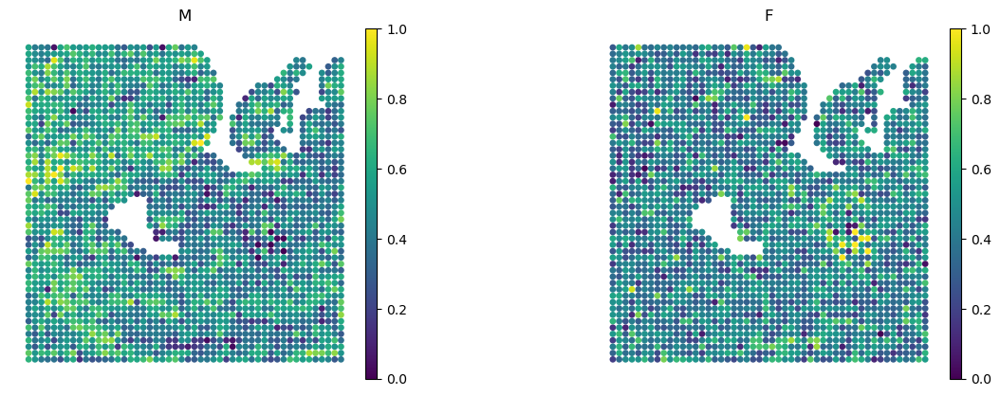

In [22]:
tg.project_cell_annotations(ad_map, ad_sp, annotation='donor_sex')
annotation_list = list(pd.unique(ad_sc.obs['donor_sex']))
tg.plot_cell_annotation_sc(ad_sp, annotation_list,x='array_col', y='array_row',spot_size= 1, scale_factor=0.1, perc=0.001)

INFO:root:spatial prediction dataframe is saved in `obsm` `tangram_ct_pred` of the spatial AnnData.


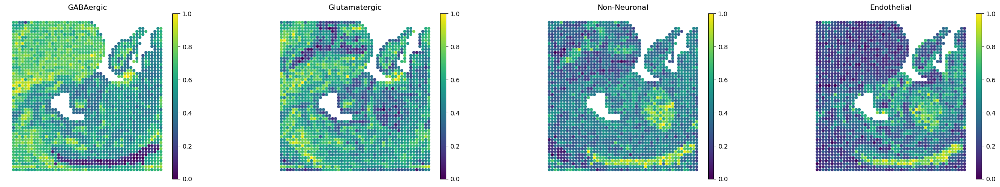

In [23]:
tg.project_cell_annotations(ad_map, ad_sp, annotation='cell_class')
annotation_list = list(pd.unique(ad_sc.obs['cell_class']))
tg.plot_cell_annotation_sc(ad_sp, annotation_list,x='array_col', y='array_row',spot_size= 1, scale_factor=0.1, perc=0.001)

INFO:root:spatial prediction dataframe is saved in `obsm` `tangram_ct_pred` of the spatial AnnData.


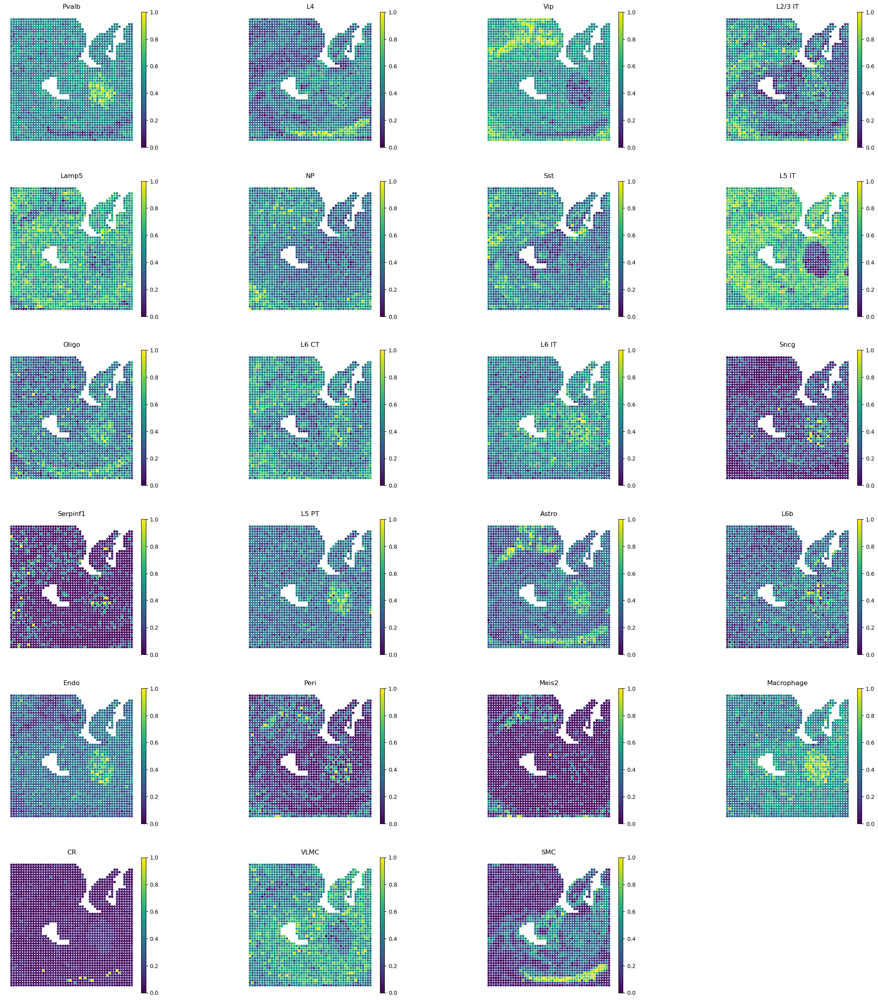

In [24]:
tg.project_cell_annotations(ad_map, ad_sp, annotation='cell_subclass')
annotation_list = list(pd.unique(ad_sc.obs['cell_subclass']))
tg.plot_cell_annotation_sc(ad_sp, annotation_list,x='array_col', y='array_row',spot_size= 1, scale_factor=0.1, perc=0.001)

- We want to inspect gene expression of training genes mapped with low scores, to understand the quality of mapping. 
- First, we need to generate "new spatial data" using the mapped single cell: this is done via `project_genes`.
- The function accepts as input a mapping (`adata_map`) and corresponding single cell data (`adata_sc`).
- The result is a voxel-by-gene `AnnData`, formally similar to `ad_sp`, but containing gene expression from the mapped single cell data rather than Slide-seq.

In [25]:
ad_ge = tg.project_genes(adata_map=ad_map, adata_sc=ad_sc)
ad_ge

AnnData object with n_obs × n_vars = 2275 × 36826
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'Sample', 'TSSEnrichment', 'ReadsInTSS', 'ReadsInPromoter', 'ReadsInBlacklist', 'PromoterRatio', 'PassQC', 'NucleosomeRatio', 'nMultiFrags', 'nMonoFrags', 'nFrags', 'nDiFrags', 'BlacklistRatio', 'cellID_archr', 'in_tissue', 'array_row', 'array_col', 'uniform_density', 'rna_count_based_density'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'sparsity', 'is_training'
    uns: 'cell_class_colors', 'cell_subclass_colors', 'hvg', 'neighbors', 'pca', 'umap', 'rank_genes_groups', 'training_genes', 'overlap_genes'

In [26]:
ad_sc.uns['training_genes']

['ank1',
 'fam210b',
 'ost4',
 'tlcd1',
 'trhr',
 'pafah1b3',
 'spock3',
 'pacsin2',
 'slc2a1',
 'scube1',
 'zbtb18',
 'gsto1',
 'lef1',
 'synpo',
 'tmod1',
 'sat1',
 'cntnap5a',
 'fezf2',
 'lgmn',
 'kcnmb2',
 'igsf21',
 'gabra5',
 'rnf152',
 'ctsb',
 'ngf',
 'c1qb',
 'srgn',
 'rtn4rl1',
 'rnpc3',
 'car2',
 'cacng5',
 'olig2',
 'igf2',
 'gm13889',
 'ahi1',
 'camk2n2',
 'camk2a',
 'edil3',
 'cit',
 'slc6a1',
 'gm13629',
 'plp1',
 'hnrnpa2b1',
 'bex4',
 'dgkb',
 'tcf4',
 'htr1f',
 'p2ry14',
 'gria3',
 'sez6l',
 'st3gal6',
 'abcb1a',
 'ifitm10',
 'foxc1',
 'cercam',
 'pcolce',
 'nefm',
 'rab27b',
 'gprasp2',
 'gpm6a',
 'ptp4a3',
 'kcnj10',
 'lrrtm4',
 'fxyd7',
 'islr2',
 'srrm4',
 'pea15a',
 'ina',
 'ogn',
 'id1',
 'dkkl1',
 'klhl13',
 'lhx5',
 'ptk2b',
 'cdh22',
 'ctgf',
 'tmem204',
 'tspan7',
 'p2ry13',
 'neurod1',
 'slc7a11',
 'pde11a',
 'tpm2',
 'bhlhe40',
 'col5a1',
 'trp53i11',
 'lgals1',
 'mt2',
 'gadd45a',
 'gmpr',
 'cdh8',
 'ctla2a',
 'basp1',
 'prelp',
 'btbd17',
 'lmo2',
 'galn

- We now choose a few training genes mapped with high score.

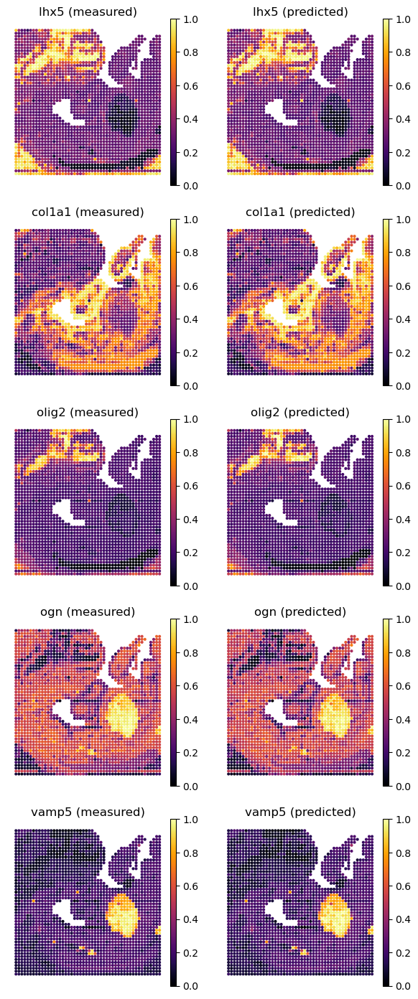

In [27]:
genes = ['lhx5', 'col1a1', 'olig2', 'ogn',  'vamp5']
ad_map.uns['train_genes_df'].loc[genes]
tg.plot_genes_sc(genes, adata_measured=ad_sp, adata_predicted=ad_ge, spot_size=1, scale_factor=0.1, perc = 0.001, return_figure=False)

In [28]:
ad_map.uns['train_genes_df'].iloc[-10:]

,train_score,sparsity_sc,sparsity_sp,sparsity_diff
mt1,0.994936,0.179794,0.0,-0.179794
ttyh1,0.994235,0.076093,0.0,-0.076093
pea15a,0.993731,0.019035,0.0,-0.019035
gpx1,0.993516,0.054524,0.0,-0.054524
ctsd,0.992534,0.021892,0.0,-0.021892
prdx2,0.990318,0.012490,0.0,-0.012490
hnrnpa2b1,0.989645,0.000507,0.0,-0.000507
ost4,0.987854,0.012905,0.0,-0.012905
tmem59l,0.987650,0.042540,0.0,-0.042540
pnpo,0.982489,0.191271,0.0,-0.191271


- We now choose a few training genes mapped with low score.

In [29]:
genes = ['ctsd', 'prdx2', 'hnrnpa2b1', 'ost4', 'tmem59l', 'pnpo']

- To visualize gene patterns, we use the helper `plot_genes`. This function accepts two voxel-by-gene `AnnData`: the actual spatial data  (`adata_measured`), and a Tangram spatial prediction (`adata_predicted`). The function returns gene expression maps from the two spatial `AnnData` on the genes `genes`.
- As expected, the predited gene expression is less sparse albeit the main patterns are captured. For these genes, we trust more the mapped gene patterns, as Tangram "corrects" gene expression by aligning in space less sparse data.

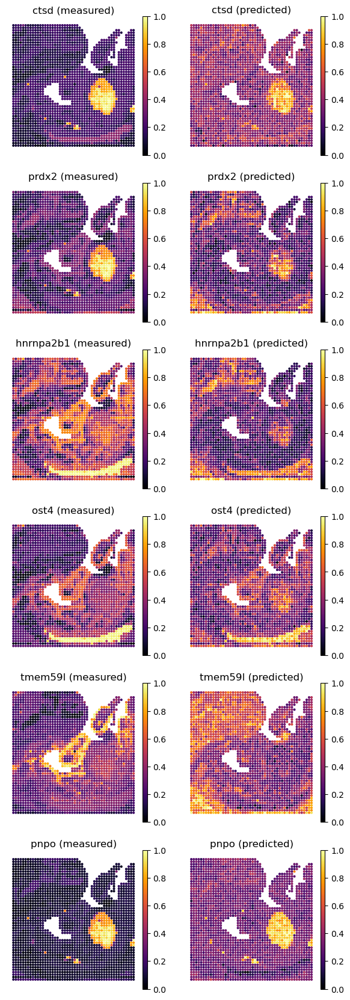

In [30]:
tg.plot_genes_sc(genes, adata_measured=ad_sp, adata_predicted=ad_ge, spot_size=1, scale_factor=0.1, perc = 0.001, return_figure=False)

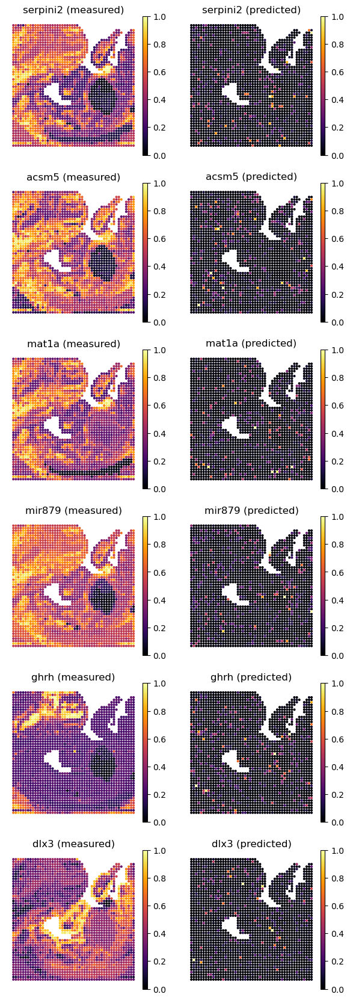

In [31]:
genes=['serpini2', 'acsm5', 'mat1a', 'mir879', 'ghrh', 'dlx3']
tg.plot_genes_sc(genes, adata_measured=ad_sp, adata_predicted=ad_ge, spot_size=1, scale_factor=0.1, perc=0.001, return_figure=False)

- An even stronger example is found in genes that are not detected in the spatial data, but are detected in the single cell data. They are removed before training with `pp_adatas` function. But tangram could still generate insight on how the spatial patterns look like.

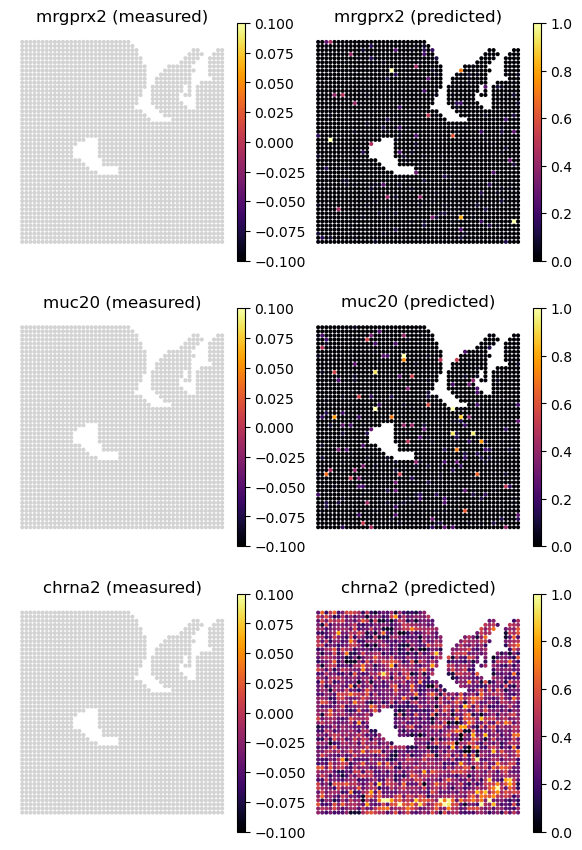

In [32]:
genes=['mrgprx2', 'muc20', 'chrna2']
tg.plot_genes_sc(genes, adata_measured=ad_sp, adata_predicted=ad_ge, spot_size=1, scale_factor=0.1, perc=0.001, return_figure=False)

- So far, we only inspected genes used to align the data (training genes), but the mapped single cell data, `ad_ge` contains the whole transcriptome. That includes more than 26k test genes.

In [33]:
(ad_ge.var.is_training == False).sum()

36648

- We can use `plot_genes` to inspect gene expression of non training genes. This is an essential step as prediction of gene expression is the how we validate mapping.
- Before doing that, it is convenient to compute the similarity scores of all genes, which can be done by `compare_spatial_geneexp`. This function accepts two spatial `AnnData`s (_ie_ voxel-by-gene), and returns a dataframe with simlarity scores for all genes. Training genes are flagged by the Boolean field `is_training`.
- If we also pass single cell `AnnData` to `compare_spatial_geneexp` function like below, a dataframe with additional sparsity columns - sparsity_sc (single cell data sparsity) and sparsity_diff (spatial data sparsity - single cell data sparsity) will return. This is required if we want to call `plot_test_scores` function later with the returned datafrme from `compare_spatial_geneexp` function.

In [34]:
df_all_genes = tg.compare_spatial_geneexp(ad_ge, ad_sp, ad_sc)
df_all_genes

,score,is_training,sparsity_sp,sparsity_sc,sparsity_diff
lhx5,0.999999,True,0.0,0.996728,-0.996728
col1a1,0.999997,True,0.0,0.986772,-0.986772
olig2,0.999995,True,0.0,0.984837,-0.984837
vamp5,0.999994,True,0.0,0.974881,-0.974881
ogn,0.999994,True,0.0,0.982855,-0.982855
...,...,...,...,...,...
cpxcr1,0.158948,False,0.0,0.999677,-0.999677
ereg,0.155581,False,0.0,0.999493,-0.999493
vgll1,0.120388,False,0.0,0.999677,-0.999677
vmn2r82,0.115464,False,0.0,0.999862,-0.999862


In [35]:
df_all_genes[df_all_genes["is_training"]==False]

,score,is_training,sparsity_sp,sparsity_sc,sparsity_diff
thoc7,0.999578,False,0.0,0.029497,-0.029497
ptprn2,0.999571,False,0.0,0.060239,-0.060239
hnrnph2,0.999231,False,0.0,0.032908,-0.032908
csmd1,0.999167,False,0.0,0.159976,-0.159976
tro,0.999158,False,0.0,0.071254,-0.071254
...,...,...,...,...,...
cpxcr1,0.158948,False,0.0,0.999677,-0.999677
ereg,0.155581,False,0.0,0.999493,-0.999493
vgll1,0.120388,False,0.0,0.999677,-0.999677
vmn2r82,0.115464,False,0.0,0.999862,-0.999862


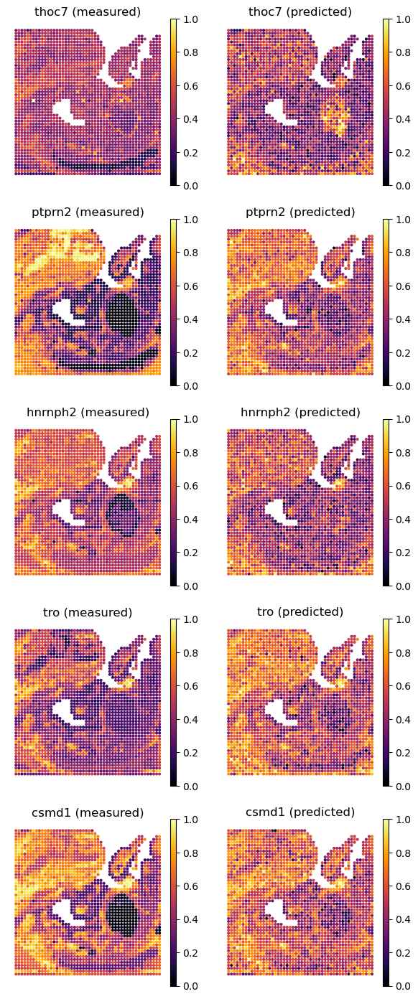

In [36]:
genes=['thoc7', 'ptprn2', 'hnrnph2', 'tro', 'csmd1']
tg.plot_genes_sc(genes, adata_measured=ad_sp, adata_predicted=ad_ge, spot_size=1, scale_factor=0.1, perc=0.001, return_figure=False)